<a href="TAIL"><img src="https://i.imgur.com/GRTE0OG.png" width="150" title="Tail Logo" /></a>

# <font color ="#00b8ff">Exercícios de Análise Exploratória de Dados</font>

 Essa lista de exercícios foi criada para que vocês possam aplicar os conhecimentos que vocês adquiriram na aula que assistiram.

Podem tirar dúvidas com **Tales Nobre** e **Felipe Duarte** quando quiserem!
**O prazo de envio do notebook é até a reunião da próxima semana, até 1 hora antes da reunião, podem enviar colocar o conteúdo na branch de vocês do repositório**



🌍 [Link do drive com todos os Datasets](https://drive.google.com/drive/folders/1LBZH7Zcch-f1tSmFgezIz7Z2QlWmNieP?usp=sharing)


###**Objetivos**


*   Entender o nível de conhecimento individual de vocês
*   Estimular vocês a praticarem os conceitos básicos de EDA


##**Observações**



*   Façam uma cópia desse notebook e realizem as questões.
*   Foquem no espaço de *Conclusões*, que aparece no final de cada questão, para explicar as conclusões que vocês chegaram a partir da análise de dados.
*   É permitido que vocês usem outras bibliotecas que acharem interessantes para realizar a EDA, mas tentem usar pelo menos em uma das questões as bibliotecas de *Pandas, Numpy e Plotly*.
*   É recomendável que vocês acessem os materiais de apoio que serão disponibilizados em seguida.
*   Prezem pela organização, é muito importante explicar cada etapa de execução, principalmente no contexto de análise de dados.
*   Claro que vocês não vão precisam importar várias vezes as bibliotecas dentro de um mesmo notebook, mas por fins educativos é recomendável que vocês façam isso nessa lista de exercícios!
*   As questões são progressivas, ou seja, a quantidade de instruções e o nível de dificuldade mudarão ao longo da lista. **Lembre-se de manter o mesmo padrão em todas as questões.**
*  Divida em quantas células e caixas de texto quiser, afim de deixar a legibilidade do código a melhor possível.



🐼 Material de apoio:


*   [Tutorial EDA Medium](https://medium.com/rumpydas/beginners-guide-to-eda-exploratory-data-analysis-on-a-real-data-set-using-numpy-pandas-in-python-c0cb4f63d50d)
*   [Tutorial EDA kaggle](https://www.kaggle.com/code/imoore/intro-to-exploratory-data-analysis-eda-in-python)
*   [Tutorial de EDA de forma aplicada](https://www.youtube.com/watch?v=-o3AxdVcUtQ)

📚Documentação das bibliotecas:
*   [Pandas](https://pandas.pydata.org/pandas-docs/stable/user_guide/10min.html)
*   [Numpy](https://numpy.org/doc/stable/user/absolute_beginners.html)
*   [Plotly](https://plotly.com/python/basic-charts/)
*   [Matplotlib](https://matplotlib.org/stable/tutorials/pyplot.html#sphx-glr-tutorials-pyplot-py)
*   [Seaborn](https://seaborn.pydata.org/tutorial/introduction.html#a-high-level-api-for-statistical-graphics)

Lembrem-se, a prática leva à perfeição!🧠

##**Questão 1:** *Desempenho dos Estudantes em Provas*

Analisando o desempenho dos estudantes em matemática, leitura e escrita no arquivo 'q1_estudantes.csv', investigue se há diferenças significativas nas pontuações com base no gênero dos estudantes e no nível de educação dos pais. Além disso, examine se a participação em cursos de preparação para testes está associada a pontuações mais altas nas avaliações.

###*1.1 Imports*

In [1]:
#Coloque nesse bloco de texto todos os imports que você vai usar na questão.
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

###*1.2 Dataset*

In [2]:

#Armazene o Dataset em uma variável para que você consiga utilizá-lo.
df = pd.read_csv('data/q1_estudantes.csv')

In [3]:
#Tire suas impressões iniciais vizualizando o head e tail desse dataset.
df.head(5)

,gender,race/ethnicity,parental level of education,lunch,test preparation course,math score,reading score,writing score
0,female,group B,bachelor's degree,standard,none,72,72,74
1,female,group C,some college,standard,completed,69,90,88
2,female,group B,master's degree,standard,none,90,95,93
3,male,group A,associate's degree,free/reduced,none,47,57,44
4,male,group C,some college,standard,none,76,78,75


In [4]:
df.shape

(1000, 8)

In [5]:
df.tail(5)

,gender,race/ethnicity,parental level of education,lunch,test preparation course,math score,reading score,writing score
995,female,group E,master's degree,standard,completed,88,99,95
996,male,group C,high school,free/reduced,none,62,55,55
997,female,group C,high school,free/reduced,completed,59,71,65
998,female,group D,some college,standard,completed,68,78,77
999,female,group D,some college,free/reduced,none,77,86,86


In [6]:

descricao_dados = df.describe()

print(descricao_dados)

       math score  reading score  writing score
count  1000.00000    1000.000000    1000.000000
mean     66.08900      69.169000      68.054000
std      15.16308      14.600192      15.195657
min       0.00000      17.000000      10.000000
25%      57.00000      59.000000      57.750000
50%      66.00000      70.000000      69.000000
75%      77.00000      79.000000      79.000000
max     100.00000     100.000000     100.000000


In [7]:
#Realize a limpeza dos dados, focando em tratar valores vazios e/ou incorretos.
not_a_number = df.isnull().sum()

print(not_a_number)


gender                         0
race/ethnicity                 0
parental level of education    0
lunch                          0
test preparation course        0
math score                     0
reading score                  0
writing score                  0
dtype: int64


In [8]:
df.nunique()

gender                          2
race/ethnicity                  5
parental level of education     6
lunch                           2
test preparation course         2
math score                     81
reading score                  72
writing score                  77
dtype: int64

In [9]:
total_por_classe = df['gender'].value_counts()
print(total_por_classe)


gender
female    518
male      482
Name: count, dtype: int64


### *1.3 Vizualização*

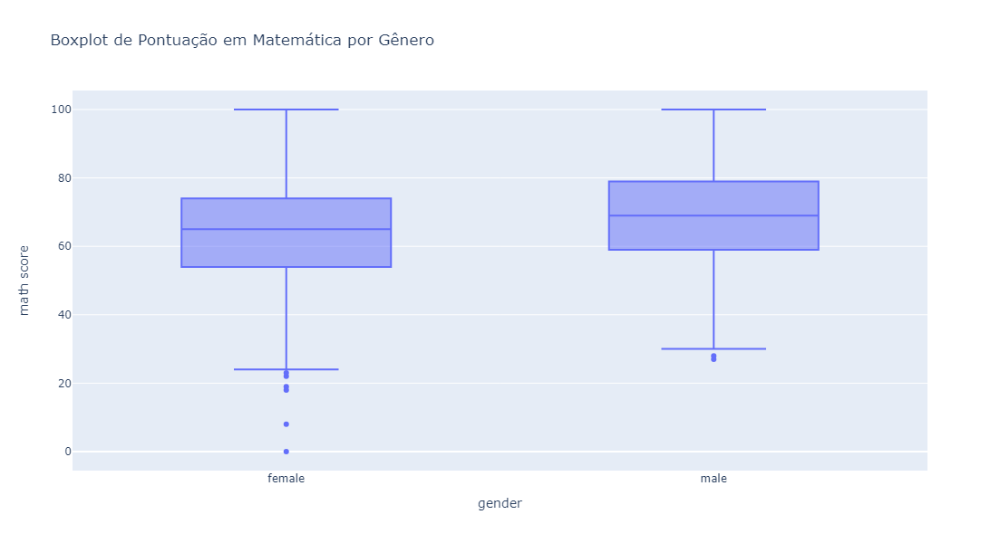

In [28]:
fig_gend_math = px.box(df, x='gender', y='math score', title='Boxplot de Pontuação em Matemática por Gênero')
#fig_gend_math.show()
fig_gend_math.update_layout(width=800, height=600)

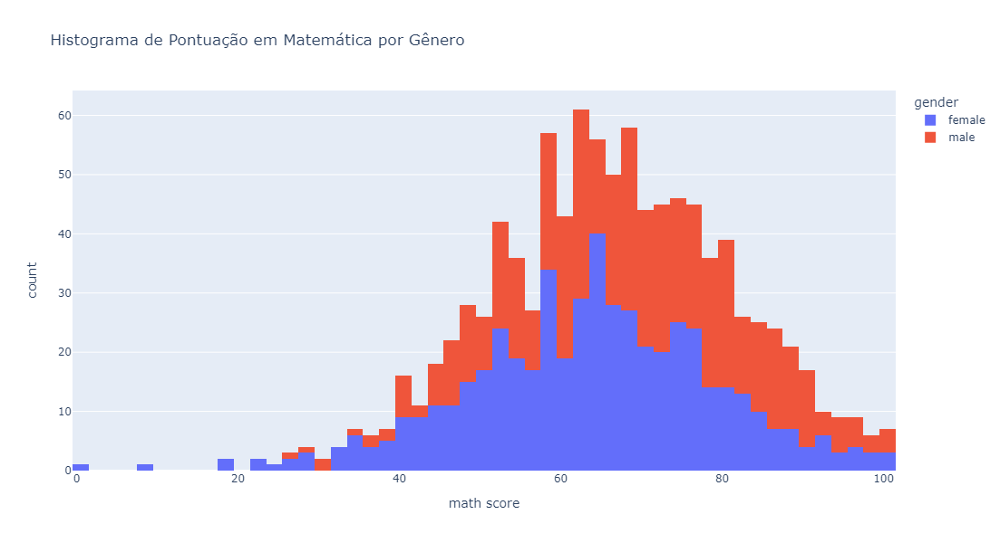

In [29]:
fig_hist_math = px.histogram(df, x='math score', color='gender', title='Histograma de Pontuação em Matemática por Gênero')

# Atualizar as dimensões da figura
fig_hist_math.update_layout(width=800, height=600)

# Mostrar o histograma
fig_hist_math.show()

In [30]:
#as mulheres estão com uma distribuição bem mais uniforme, mas os homens estão mais concentrados nas melhores notas

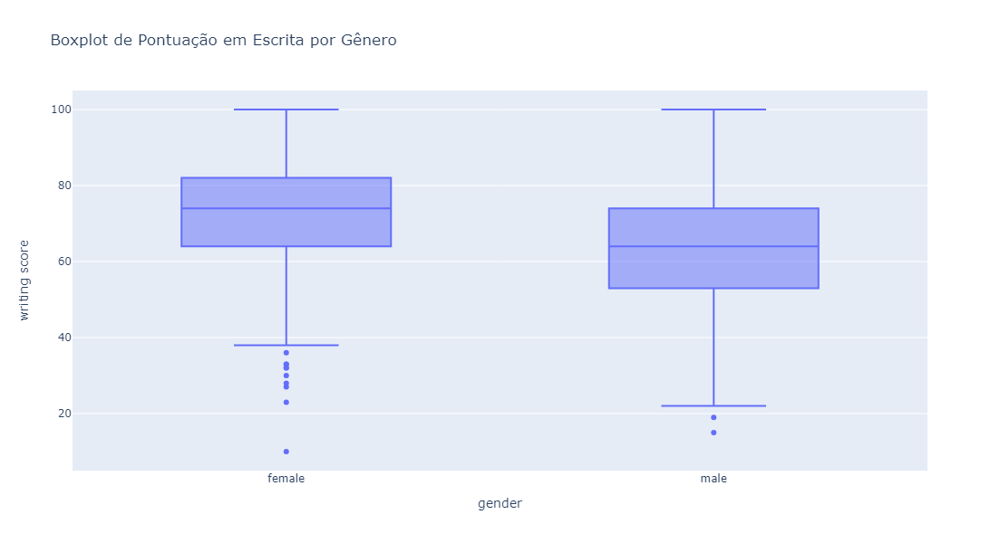

In [31]:
fig_gend_wri = px.box(df, x='gender', y='writing score', title='Boxplot de Pontuação em Escrita por Gênero')

fig_gend_wri.update_layout(width=800, height=600)

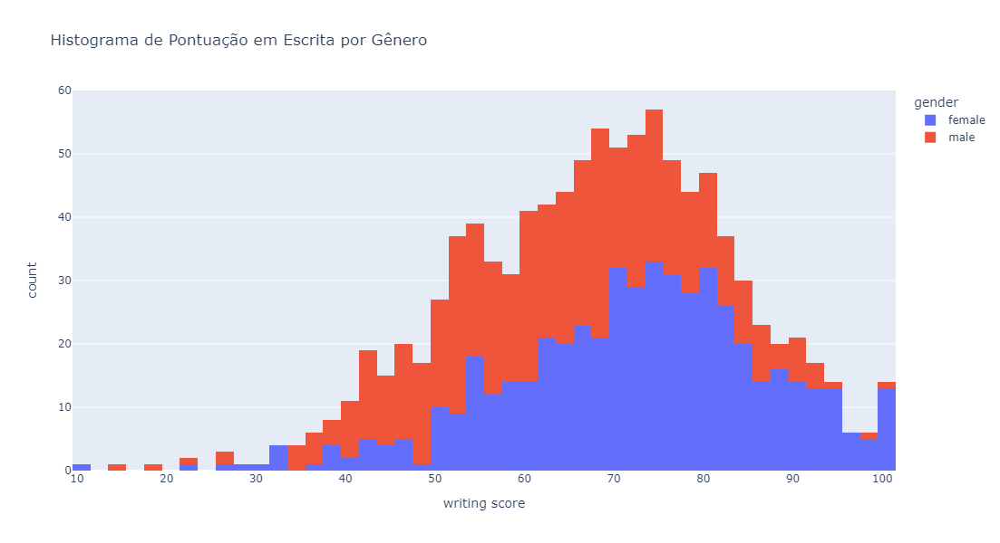

In [32]:
fig_hist_wri = px.histogram(df, x='writing score', color='gender', title='Histograma de Pontuação em Escrita por Gênero')

# Atualizar as dimensões da figura
fig_hist_wri.update_layout(width=800, height=600)

# Mostrar o histograma
fig_hist_wri.show()

In [33]:
#os homens estão com uma distribuição mais uniforme, mas as mulheres estão mais concentrados nas melhores notas

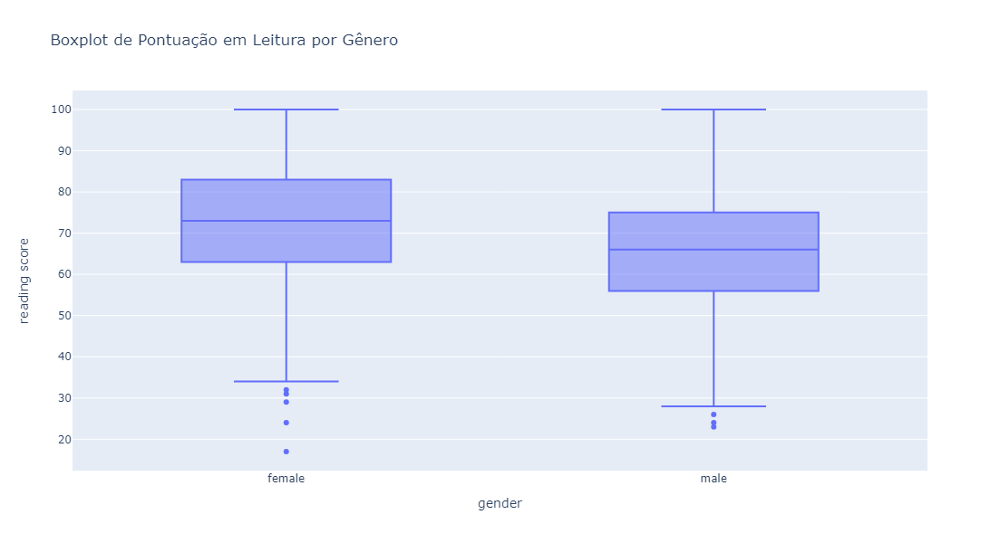

In [34]:
fig_gend_rea = px.box(df, x='gender', y='reading score', title='Boxplot de Pontuação em Leitura por Gênero')

fig_gend_rea.update_layout(width=800, height=600)

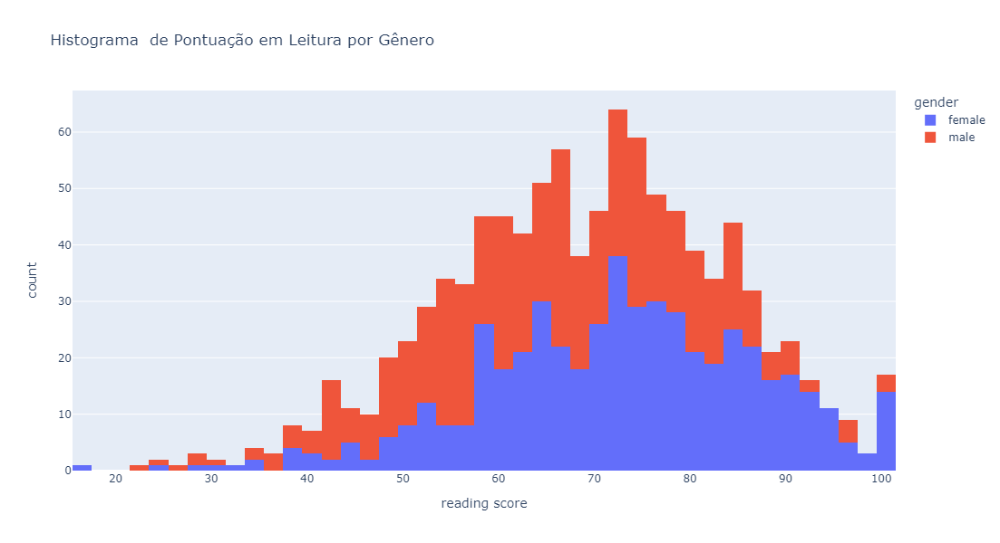

In [28]:
fig_hist_rea = px.histogram(df, x='reading score', color='gender', title='Histograma  de Pontuação em Leitura por Gênero')

# Atualizar as dimensões da figura
fig_hist_rea.update_layout(width=800, height=600)

# Mostrar o histograma
fig_hist_rea.show()

In [ ]:
#os homens estão com uma distribuição mais uniforme, mas as mulheres estão mais concentrados nas melhores notas

In [16]:
total_por_classe_pl = df['parental level of education'].value_counts()
print(total_por_classe_pl)

#a distribuição tá muito diferente, então não vai me dizer nada um histograma

parental level of education
some college          226
associate's degree    222
high school           196
some high school      179
bachelor's degree     118
master's degree        59
Name: count, dtype: int64


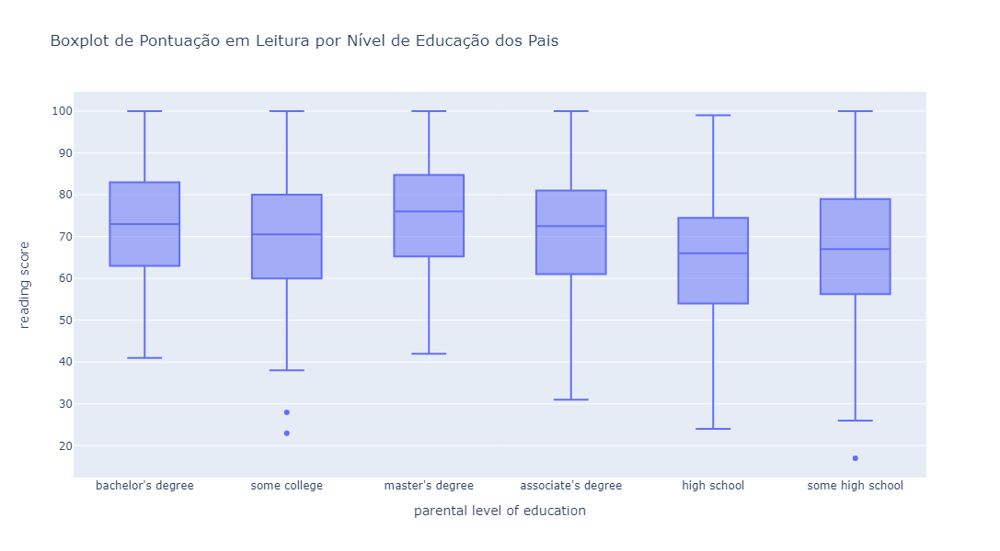

In [20]:
fig_r_p = px.box(df, x='parental level of education', y='reading score', title='Boxplot de Pontuação em Leitura por Nível de Educação dos Pais')

fig_r_p.update_layout(width=800, height=600)

In [ ]:
#as melhores notas em leitura foram de estudantes que possuem parentes com mestrado, seguido por bacharelado, grau associado, alguma escolaridade, algum ensino médio e por fim aqueles com parentes que concluiram ensino médio apenas.

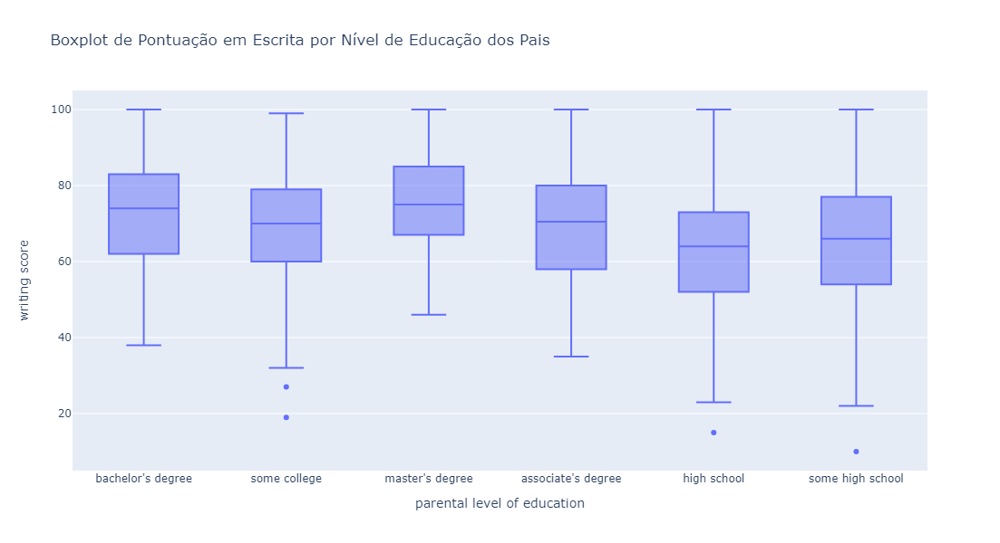

In [21]:
fig_w_p = px.box(df, x='parental level of education', y='writing score', title='Boxplot de Pontuação em Escrita por Nível de Educação dos Pais')

fig_w_p.update_layout(width=800, height=600)

In [ ]:
#as melhores notas em escrita foram de estudantes que possuem parentes com mestrado, seguido por bacharelado, grau associado, alguma escolaridade , algum ensino médio e por fim aqueles com parentes que concluiram ensino médio apenas.

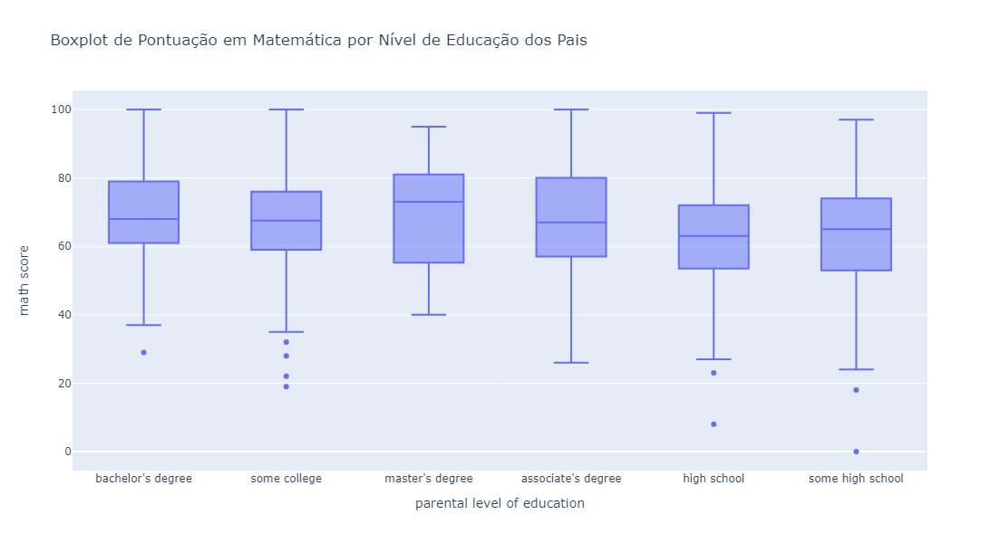

In [22]:
fig_m_p = px.box(df, x='parental level of education', y='math score', title='Boxplot de Pontuação em Matemática por Nível de Educação dos Pais')

fig_m_p.update_layout(width=800, height=600)

In [ ]:
#as melhores notas em matemática foram de estudantes que possuem parentes com mestrado, seguido por grau associado, bacharelado, alguma escolaridade , algum ensino médio e por fim aqueles com parentes que concluiram ensino médio apenas.

In [23]:
total_por_classe_pc = df['test preparation course'].value_counts()
print(total_por_classe_pc)

#a distribuição tá muito diferente, então não vai me dizer nada um histograma

test preparation course
none         642
completed    358
Name: count, dtype: int64


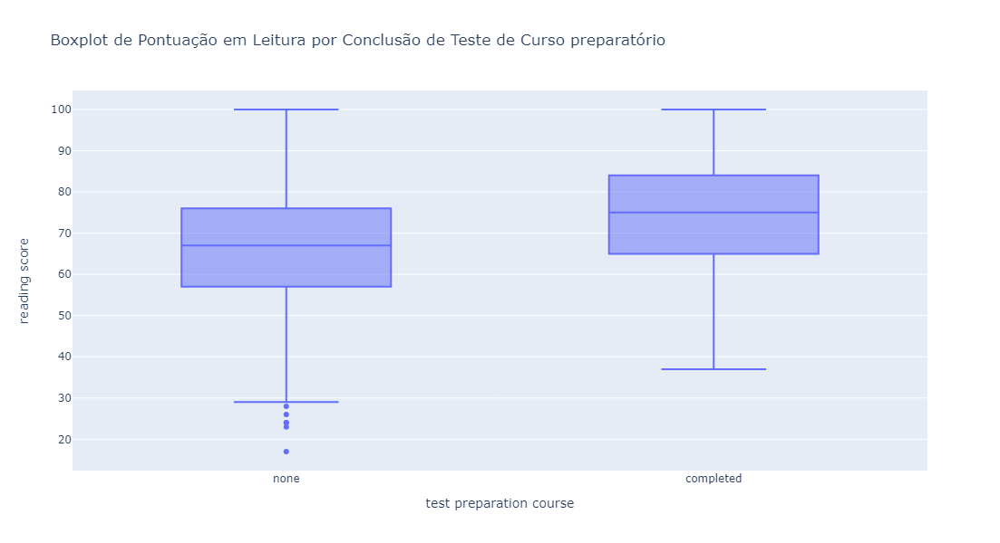

In [24]:
fig_r_c = px.box(df, x='test preparation course', y='reading score', title='Boxplot de Pontuação em Leitura por Conclusão de Teste de Curso preparatório')

fig_r_c.update_layout(width=800, height=600)

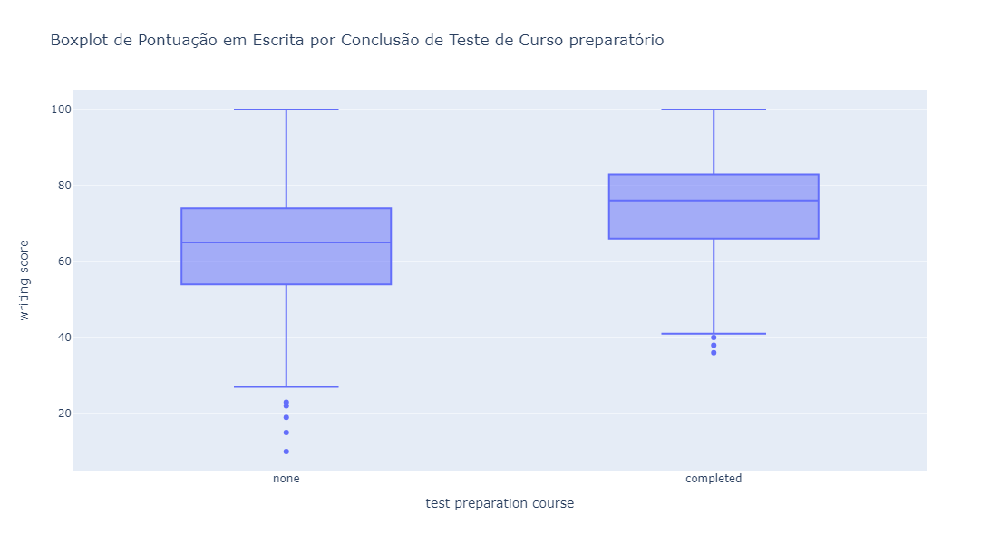

In [25]:
fig_w_c = px.box(df, x='test preparation course', y='writing score', title='Boxplot de Pontuação em Escrita por Conclusão de Teste de Curso preparatório')

fig_w_c.update_layout(width=800, height=600)

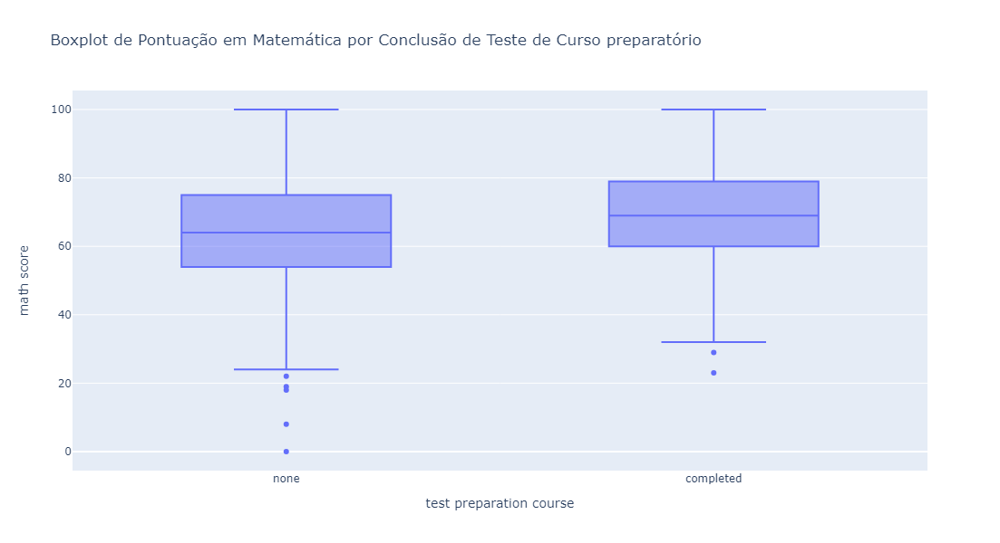

In [26]:
fig_m_c = px.box(df, x='test preparation course', y='math score', title='Boxplot de Pontuação em Matemática por Conclusão de Teste de Curso preparatório')

fig_m_c.update_layout(width=800, height=600)

In [27]:
#estudantes que concluiram o teste de curso preparatório se sairam melhor nos 3 testes (leitura, escrita e matemática)

### *1.4 Conclusões*

In [35]:
#Insira aqui as conclusões que você conseguiu absorver a partir desse Dataset.
Conclusoes = """Estudantes do gênero feminino obtiveram melhores pontuações em Leitura e Escrita, 
enquanto estudantes do sexo masculino obtiveram melhores resultados em Matemática.\n
Estudantes que possuem parentes com mestrado, bacharelado ou grau associado obtiveram os melhores resultados nos 3 testes,
enquanto aqueles que possuem parentes apenas com ensino médio ou algum ensino médio obtiveram os priores resultados.\n
Estudantes que concluiram teste de curso preparatório obtiveram melhores resultados nos 3 testes.
"""






print(Conclusoes)

Estudantes do gênero feminino obtiveram melhores pontuações em Leitura e Escrita, 
enquanto estudantes do sexo masculino obtiveram melhores resultados em Matemática.

Estudantes que possuem parentes com mestrado, bacharelado ou grau associado obtiveram os melhores resultados nos 3 testes,
enquanto aqueles que possuem parentes apenas com ensino médio ou algum ensino médio obtiveram os priores resultados.

Estudantes que concluiram teste de curso preparatório obtiveram melhores resultados nos 3 testes.



##**Questão 2:** *Indicadores de Mudança de Clima*


Examine as tendências de mudança de temperatura ao longo dos anos, conforme apresentado no arquivo 'q2_clima.csv'. Analise como diferentes países e regiões têm experimentado variações na temperatura média ao longo do tempo. Além disso, explore possíveis correlações entre o grau de variação de temperatura e fatores geográficos ou econômicos dos países.

###*2.1 Imports*

In [29]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder


###*2.2 Dataset*

In [30]:

data = pd.read_csv('data/obesity_level.csv')

### *2.3 Vizualização*

In [31]:

descricao_dados_2 = data.describe()

print(descricao_dados_2)

                id           Age        Height        Weight  \
count  20758.00000  20758.000000  20758.000000  20758.000000   
mean   10378.50000     23.841804      1.700245     87.887768   
std     5992.46278      5.688072      0.087312     26.379443   
min        0.00000     14.000000      1.450000     39.000000   
25%     5189.25000     20.000000      1.631856     66.000000   
50%    10378.50000     22.815416      1.700000     84.064875   
75%    15567.75000     26.000000      1.762887    111.600553   
max    20757.00000     61.000000      1.975663    165.057269   

       family_history_with_overweight          FAVC          FCVC  \
count                    20758.000000  20758.000000  20758.000000   
mean                         0.819636      0.914443      2.445908   
std                          0.384500      0.279716      0.533218   
min                          0.000000      0.000000      1.000000   
25%                          1.000000      1.000000      2.000000   
50%      

In [32]:
data.head(5)

,id,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,0be1dad
0,0,Male,24.443011,1.699998,81.669950,1,1,2.000000,2.983297,Sometimes,0,2.763573,0,0.000000,0.976473,Sometimes,Public_Transportation,Overweight_Level_II
1,1,Female,18.000000,1.560000,57.000000,1,1,2.000000,3.000000,Frequently,0,2.000000,0,1.000000,1.000000,0,Automobile,0rmal_Weight
2,2,Female,18.000000,1.711460,50.165754,1,1,1.880534,1.411685,Sometimes,0,1.910378,0,0.866045,1.673584,0,Public_Transportation,Insufficient_Weight
3,3,Female,20.952737,1.710730,131.274851,1,1,3.000000,3.000000,Sometimes,0,1.674061,0,1.467863,0.780199,Sometimes,Public_Transportation,Obesity_Type_III
4,4,Male,31.641081,1.914186,93.798055,1,1,2.679664,1.971472,Sometimes,0,1.979848,0,1.967973,0.931721,Sometimes,Public_Transportation,Overweight_Level_II


In [33]:
data.shape

(20758, 18)

In [34]:

not_a_number = data.isnull().sum()

# Configurar pandas para exibir todas as linhas
pd.set_option('display.max_rows', None)

print(not_a_number)


id                                0
Gender                            0
Age                               0
Height                            0
Weight                            0
family_history_with_overweight    0
FAVC                              0
FCVC                              0
NCP                               0
CAEC                              0
SMOKE                             0
CH2O                              0
SCC                               0
FAF                               0
TUE                               0
CALC                              0
MTRANS                            0
0be1dad                           0
dtype: int64


In [35]:
data = data.drop(columns=['id'])

data.head()

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,0be1dad
0,Male,24.443011,1.699998,81.669950,1,1,2.000000,2.983297,Sometimes,0,2.763573,0,0.000000,0.976473,Sometimes,Public_Transportation,Overweight_Level_II
1,Female,18.000000,1.560000,57.000000,1,1,2.000000,3.000000,Frequently,0,2.000000,0,1.000000,1.000000,0,Automobile,0rmal_Weight
2,Female,18.000000,1.711460,50.165754,1,1,1.880534,1.411685,Sometimes,0,1.910378,0,0.866045,1.673584,0,Public_Transportation,Insufficient_Weight
3,Female,20.952737,1.710730,131.274851,1,1,3.000000,3.000000,Sometimes,0,1.674061,0,1.467863,0.780199,Sometimes,Public_Transportation,Obesity_Type_III
4,Male,31.641081,1.914186,93.798055,1,1,2.679664,1.971472,Sometimes,0,1.979848,0,1.967973,0.931721,Sometimes,Public_Transportation,Overweight_Level_II


In [36]:
# Verificar os tipos de dados de cada coluna
tipos_de_dados_2 = data.dtypes

# Filtrar colunas numéricas
colunas_numericas_2 = tipos_de_dados_2[tipos_de_dados_2 != 'object'].index.tolist()

# Filtrar colunas categóricas
colunas_categoricas_2 = tipos_de_dados_2[tipos_de_dados_2 == 'object'].index.tolist()

print("Colunas Numéricas:")
print(colunas_numericas_2)

print("\nColunas Categóricas:")
print(colunas_categoricas_2)

Colunas Numéricas:
['Age', 'Height', 'Weight', 'family_history_with_overweight', 'FAVC', 'FCVC', 'NCP', 'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE']

Colunas Categóricas:
['Gender', 'CAEC', 'CALC', 'MTRANS', '0be1dad']


C:\Users\pamel\AppData\Local\Temp\ipykernel_8476\3677876908.py:4: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


C:\Users\pamel\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



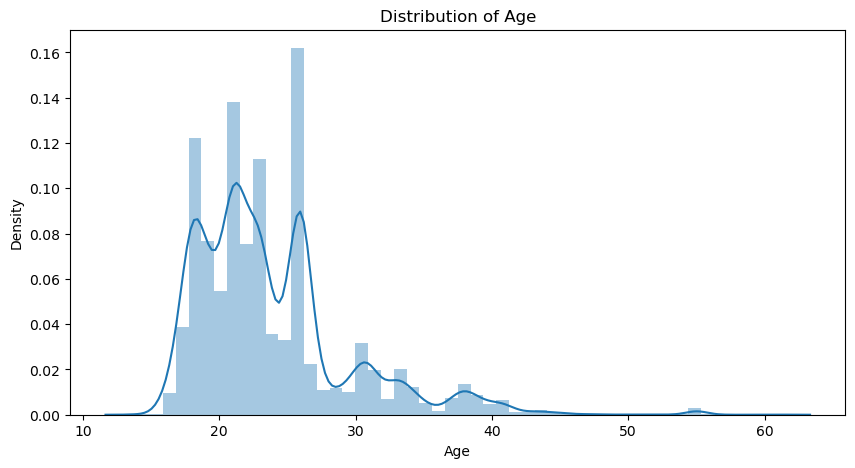

C:\Users\pamel\AppData\Local\Temp\ipykernel_8476\3677876908.py:4: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


C:\Users\pamel\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



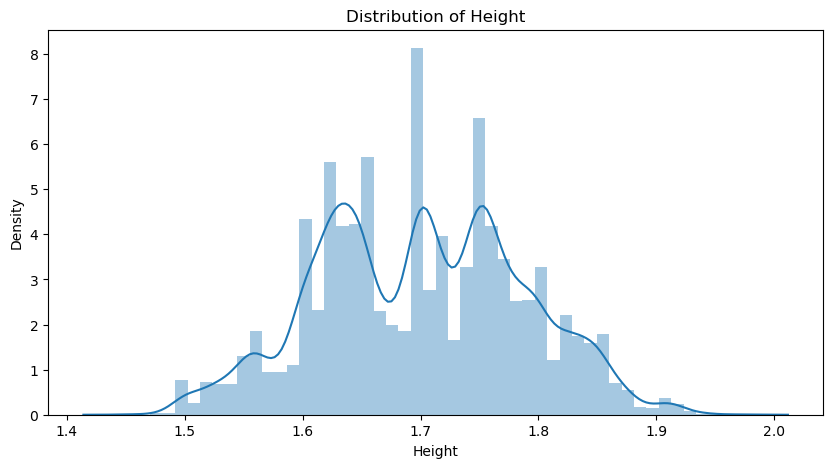

C:\Users\pamel\AppData\Local\Temp\ipykernel_8476\3677876908.py:4: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


C:\Users\pamel\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



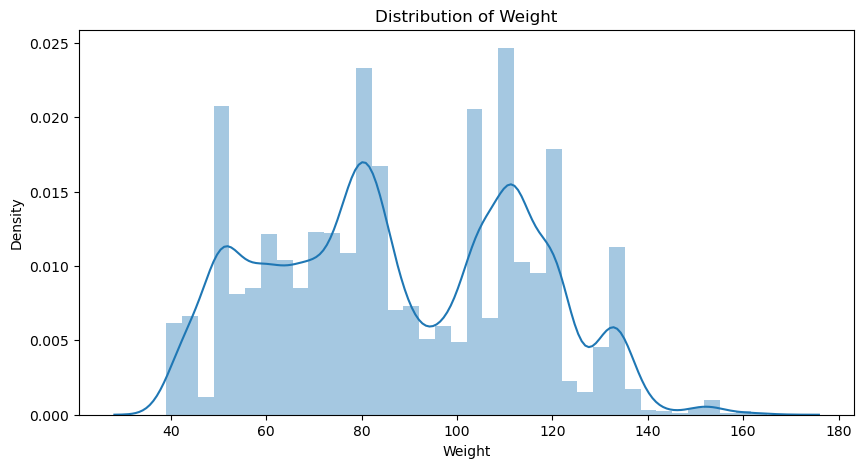

C:\Users\pamel\AppData\Local\Temp\ipykernel_8476\3677876908.py:4: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


C:\Users\pamel\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



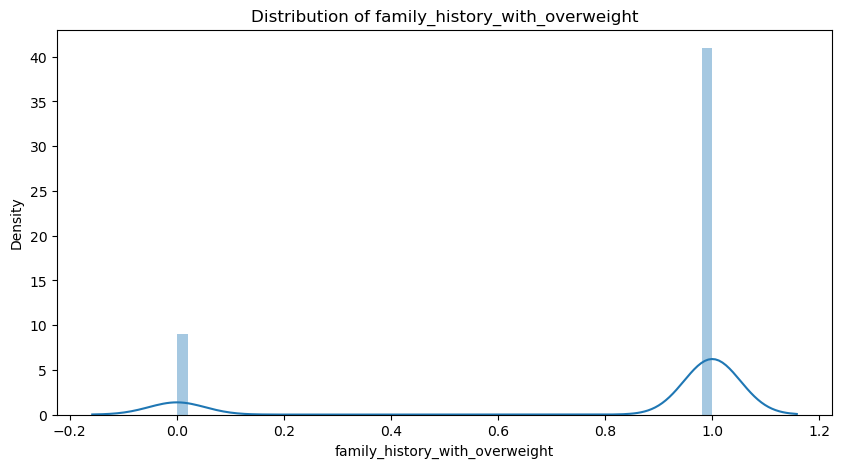

C:\Users\pamel\AppData\Local\Temp\ipykernel_8476\3677876908.py:4: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


C:\Users\pamel\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



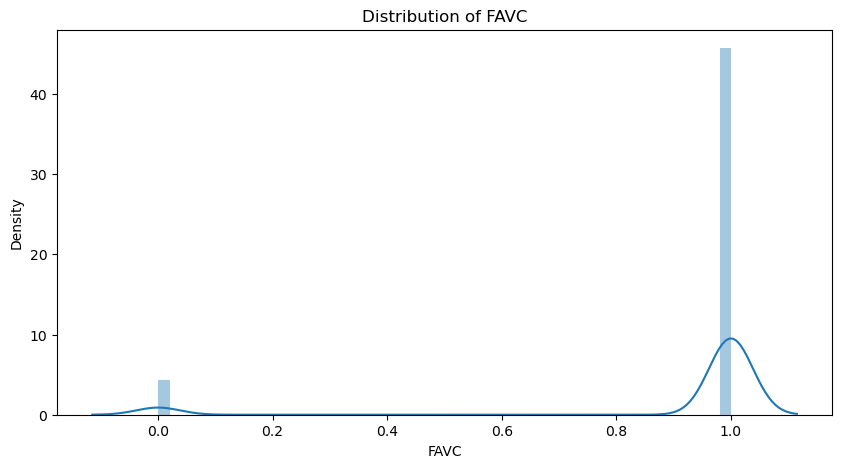

C:\Users\pamel\AppData\Local\Temp\ipykernel_8476\3677876908.py:4: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


C:\Users\pamel\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



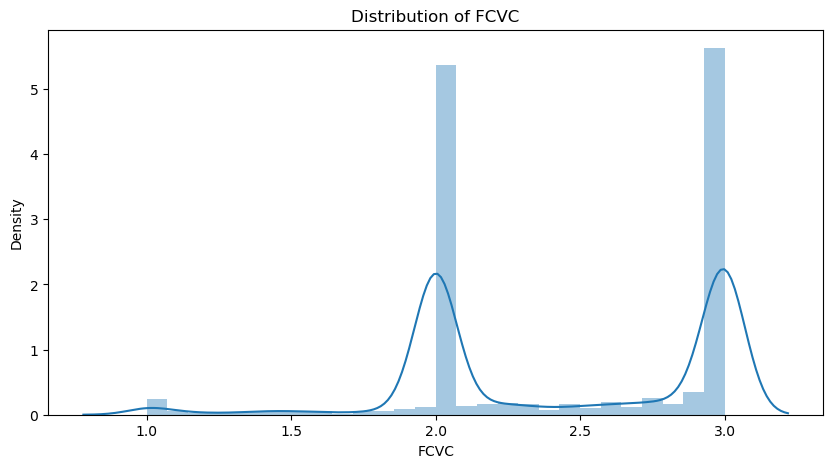

C:\Users\pamel\AppData\Local\Temp\ipykernel_8476\3677876908.py:4: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


C:\Users\pamel\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



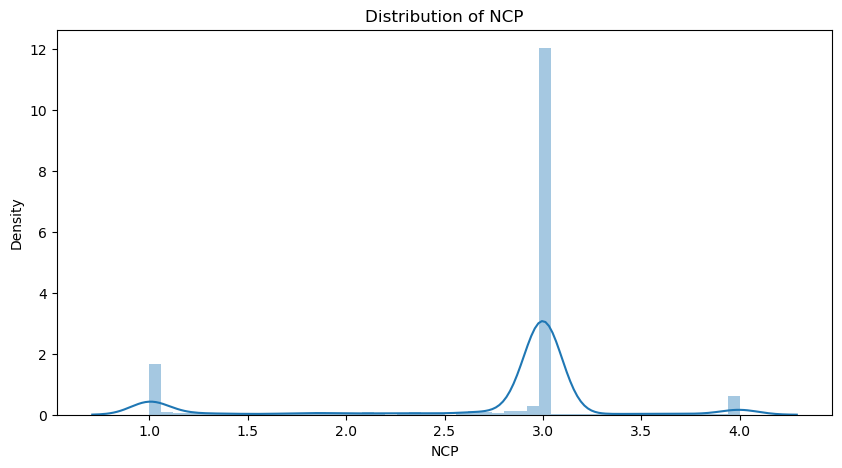

C:\Users\pamel\AppData\Local\Temp\ipykernel_8476\3677876908.py:4: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


C:\Users\pamel\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



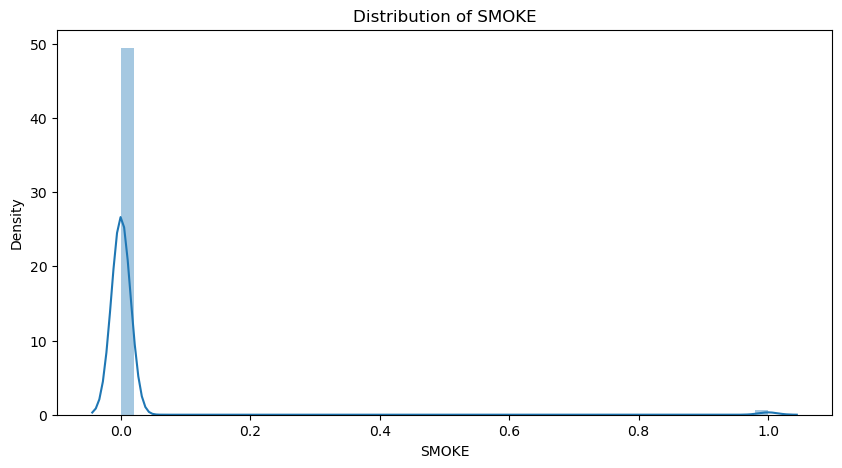

C:\Users\pamel\AppData\Local\Temp\ipykernel_8476\3677876908.py:4: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


C:\Users\pamel\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



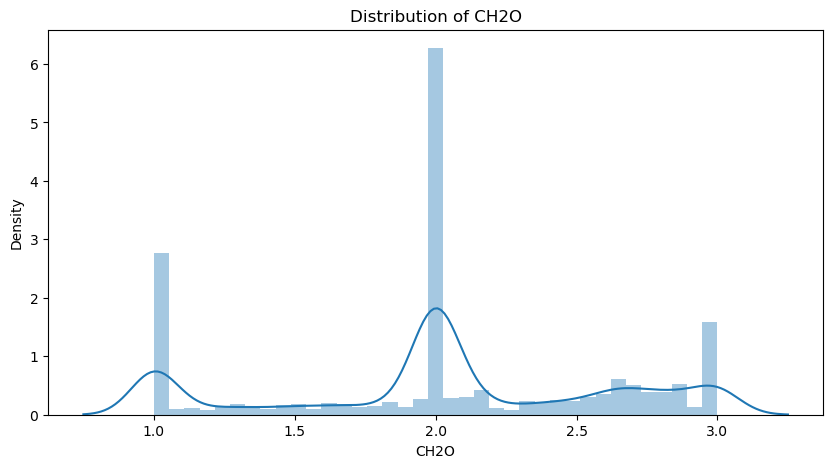

C:\Users\pamel\AppData\Local\Temp\ipykernel_8476\3677876908.py:4: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


C:\Users\pamel\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



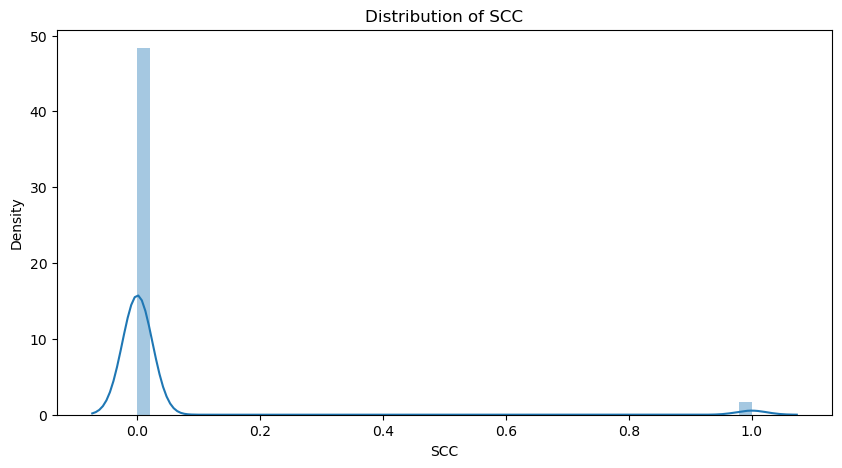

C:\Users\pamel\AppData\Local\Temp\ipykernel_8476\3677876908.py:4: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


C:\Users\pamel\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



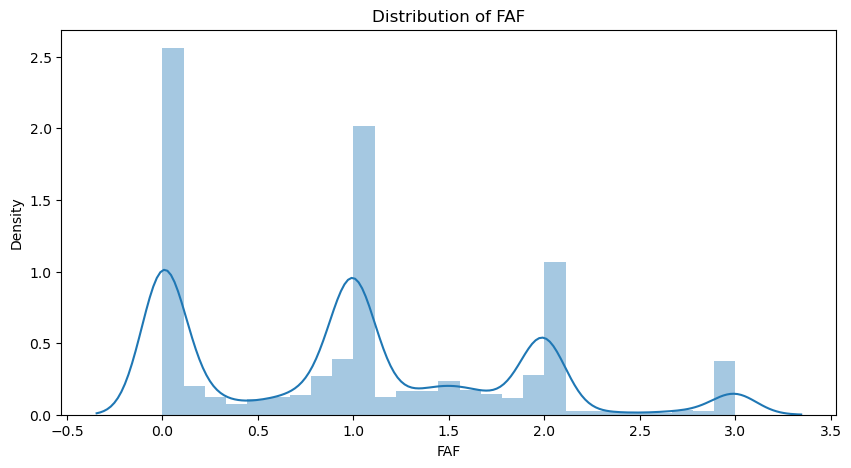

C:\Users\pamel\AppData\Local\Temp\ipykernel_8476\3677876908.py:4: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


C:\Users\pamel\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



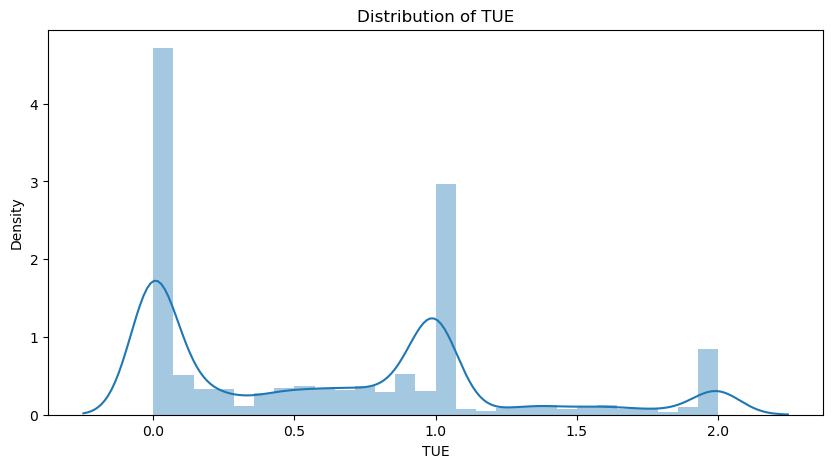

In [37]:
for col in colunas_numericas_2:
    plt.figure(figsize=(10, 5))
    plt.title(f"Distribution of {col}")
    sns.distplot(data[col])
    plt.show()

In [38]:
data.head(5)

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,0be1dad
0,Male,24.443011,1.699998,81.669950,1,1,2.000000,2.983297,Sometimes,0,2.763573,0,0.000000,0.976473,Sometimes,Public_Transportation,Overweight_Level_II
1,Female,18.000000,1.560000,57.000000,1,1,2.000000,3.000000,Frequently,0,2.000000,0,1.000000,1.000000,0,Automobile,0rmal_Weight
2,Female,18.000000,1.711460,50.165754,1,1,1.880534,1.411685,Sometimes,0,1.910378,0,0.866045,1.673584,0,Public_Transportation,Insufficient_Weight
3,Female,20.952737,1.710730,131.274851,1,1,3.000000,3.000000,Sometimes,0,1.674061,0,1.467863,0.780199,Sometimes,Public_Transportation,Obesity_Type_III
4,Male,31.641081,1.914186,93.798055,1,1,2.679664,1.971472,Sometimes,0,1.979848,0,1.967973,0.931721,Sometimes,Public_Transportation,Overweight_Level_II


In [39]:
print(data.columns)


Index(['Gender', 'Age', 'Height', 'Weight', 'family_history_with_overweight',
       'FAVC', 'FCVC', 'NCP', 'CAEC', 'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE',
       'CALC', 'MTRANS', '0be1dad'],
      dtype='object')


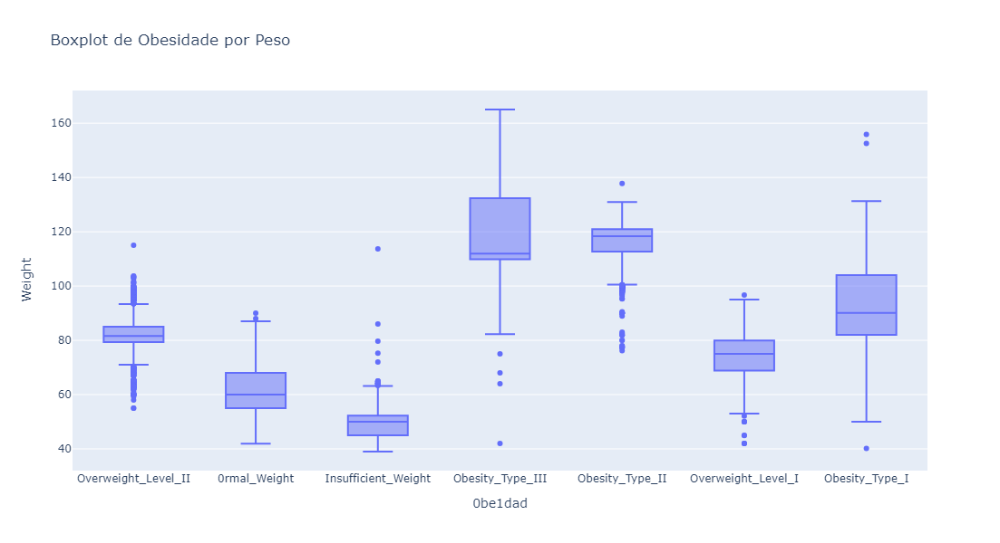

In [40]:
fig_obs_peso = px.box(data, x='0be1dad', y='Weight', title='Boxplot de Obesidade por Peso')

fig_obs_peso.update_layout(width=800, height=600)


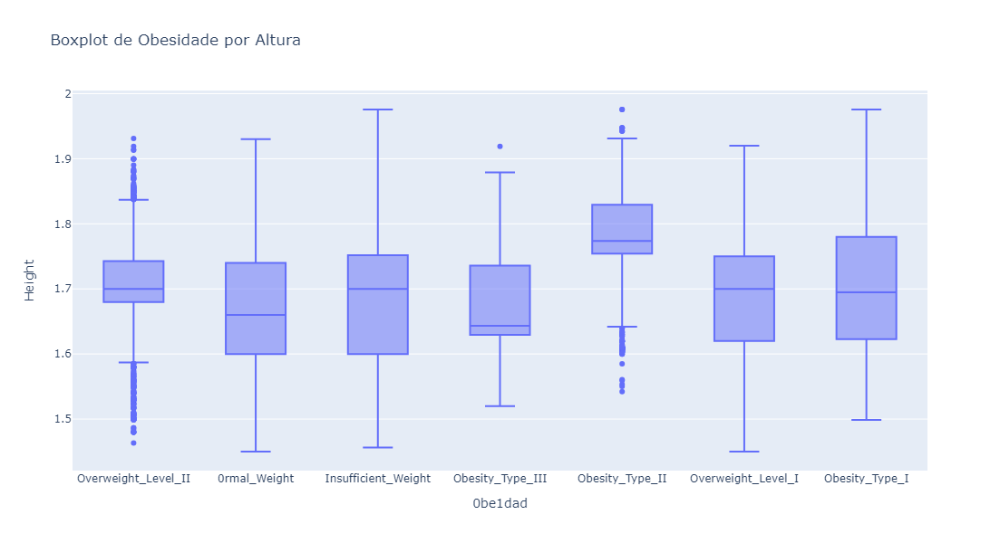

In [41]:
fig_obs_alt = px.box(data, x='0be1dad', y='Height', title='Boxplot de Obesidade por Altura')

fig_obs_alt.update_layout(width=800, height=600)

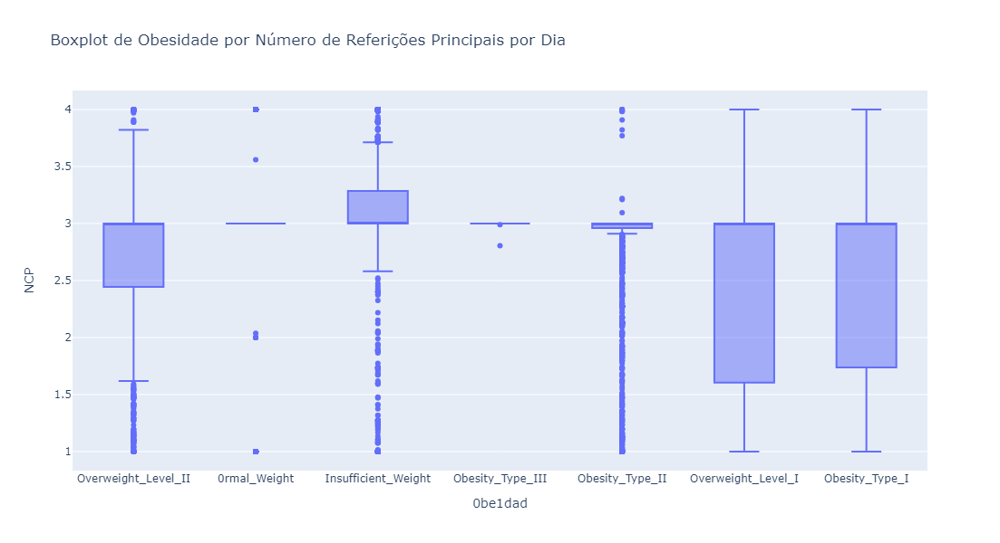

In [49]:
fig_obs_ref = px.box(data, x='0be1dad', y='NCP', title='Boxplot de Obesidade por Número de Referições Principais por Dia')

fig_obs_ref.update_layout(width=800, height=600)

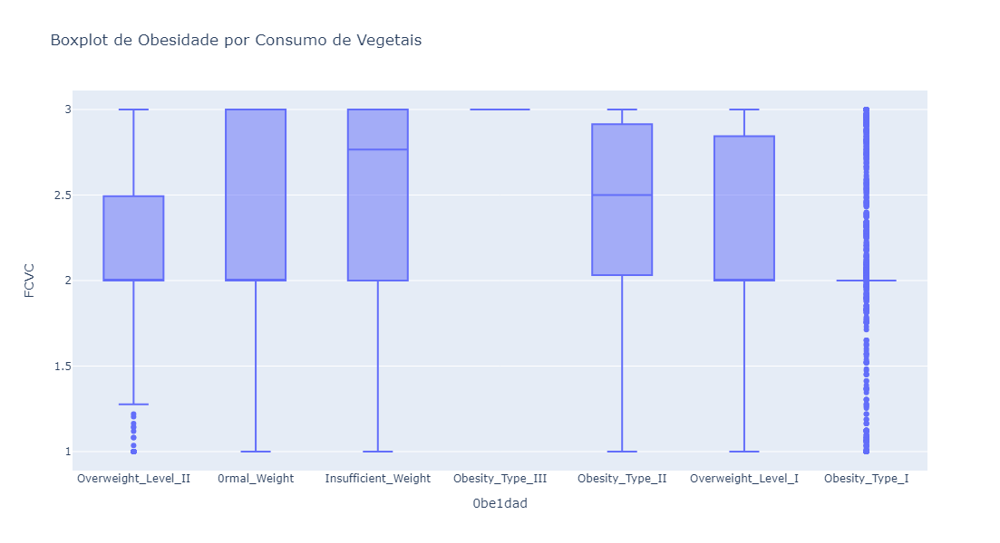

In [50]:
fig_obs_vege = px.box(data, x='0be1dad', y='FCVC', title='Boxplot de Obesidade por Consumo de Vegetais')

fig_obs_vege.update_layout(width=800, height=600)

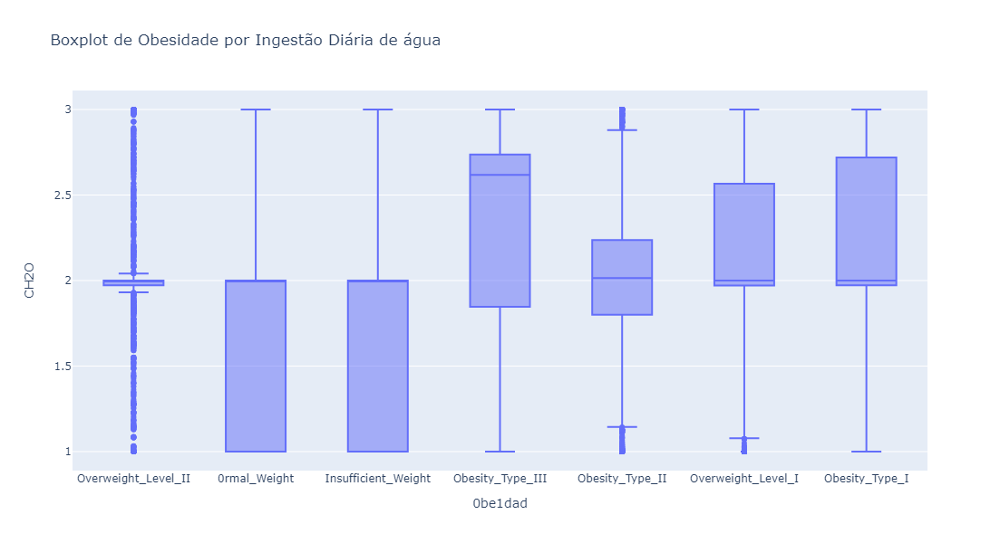

In [44]:
fig_obs_agua = px.box(data, x='0be1dad', y='CH2O', title='Boxplot de Obesidade por Ingestão Diária de água')

fig_obs_agua.update_layout(width=800, height=600)

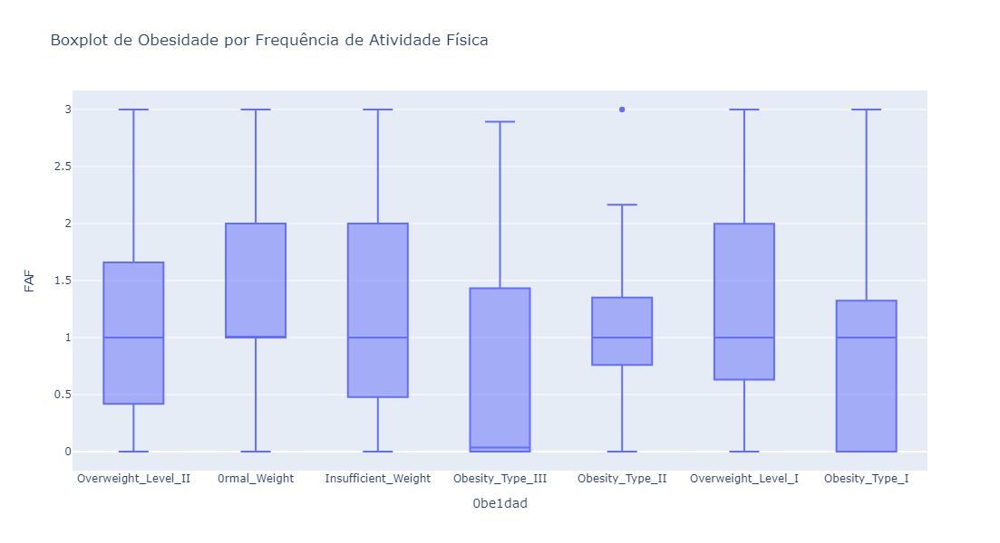

In [45]:
fig_obs_fisic = px.box(data, x='0be1dad', y='FAF', title='Boxplot de Obesidade por Frequência de Atividade Física')

fig_obs_fisic.update_layout(width=800, height=600)

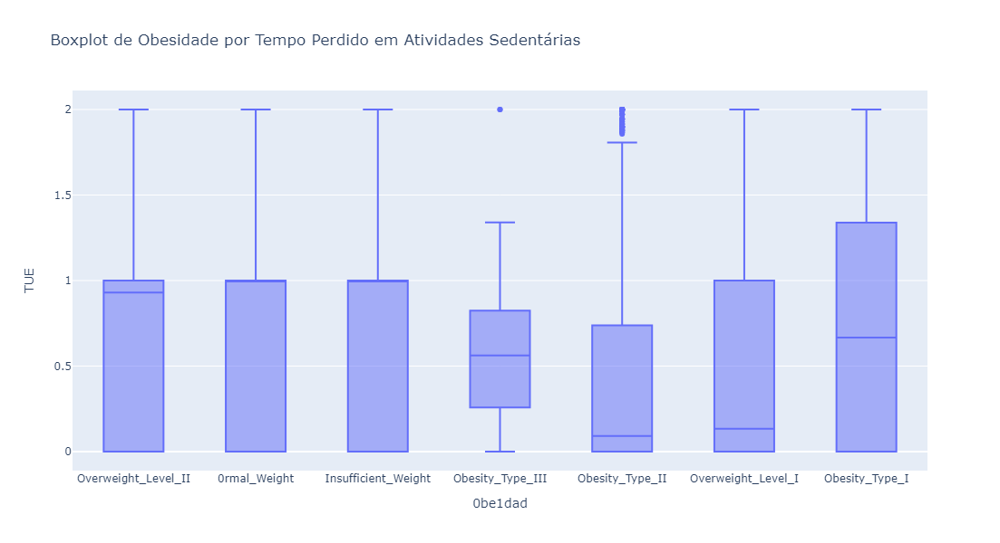

In [46]:
fig_obs_sedent = px.box(data, x='0be1dad', y='TUE', title='Boxplot de Obesidade por Tempo Perdido em Atividades Sedentárias')

fig_obs_sedent.update_layout(width=800, height=600)

In [47]:
categoricals = ["Gender", "family_history_with_overweight", "FAVC", "CAEC", "SMOKE", "SCC", "CALC", "MTRANS" ]

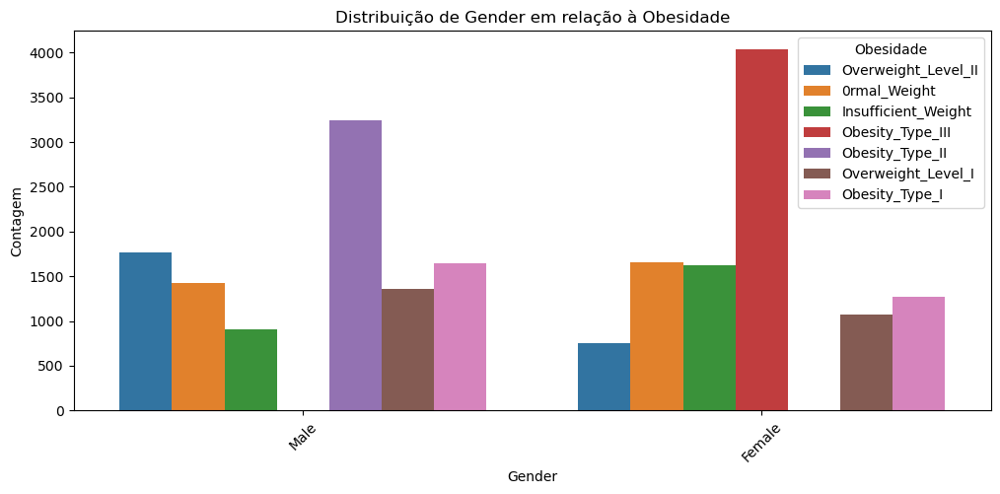

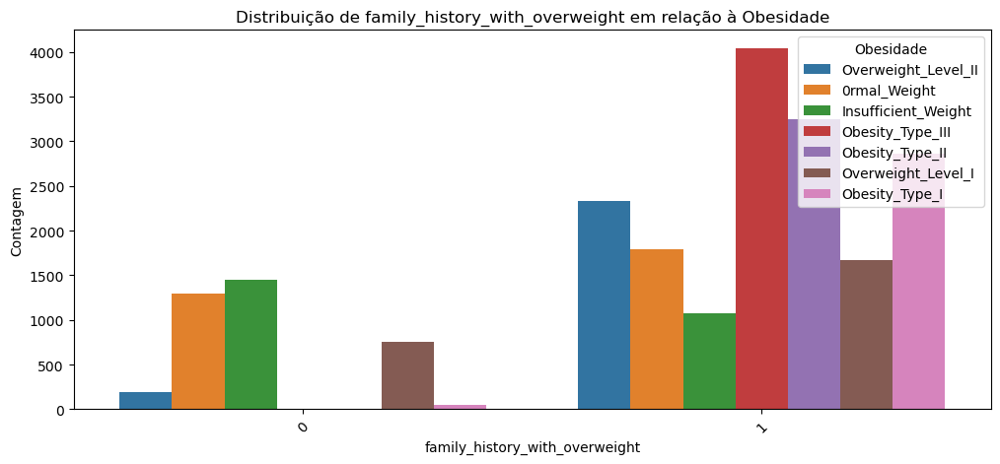

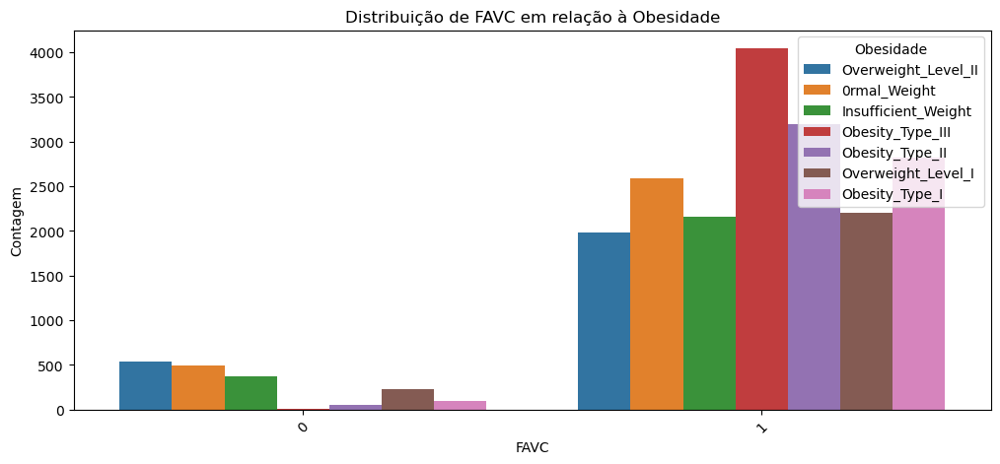

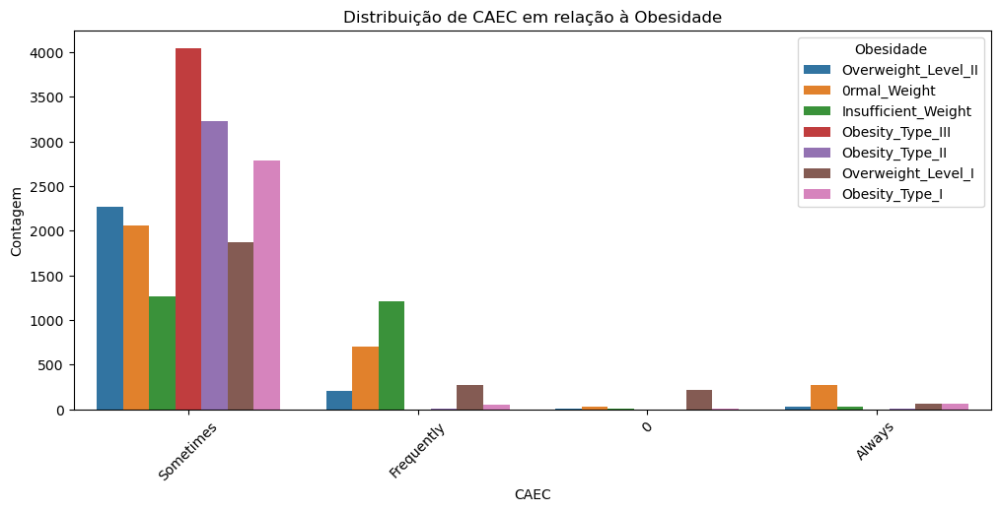

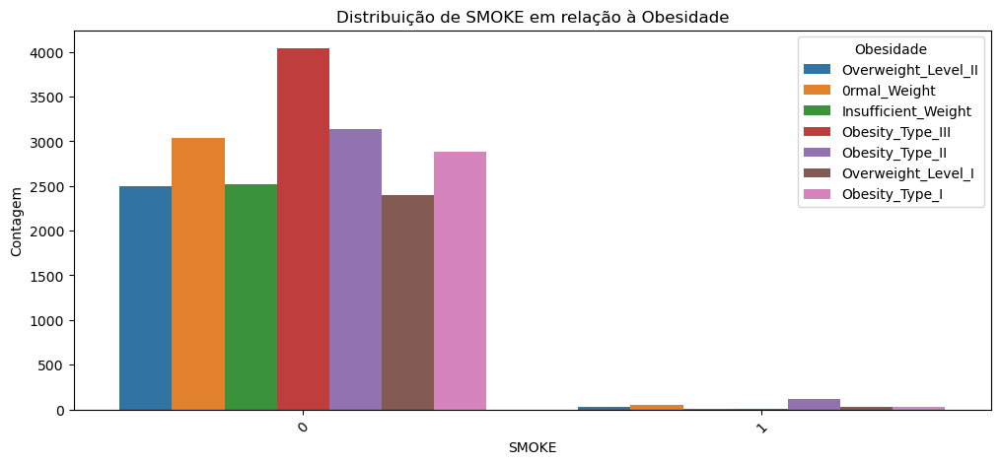

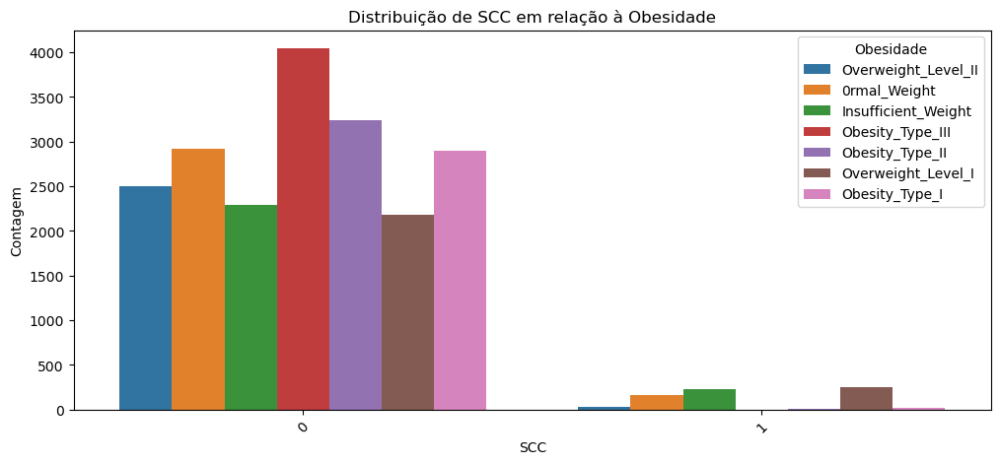

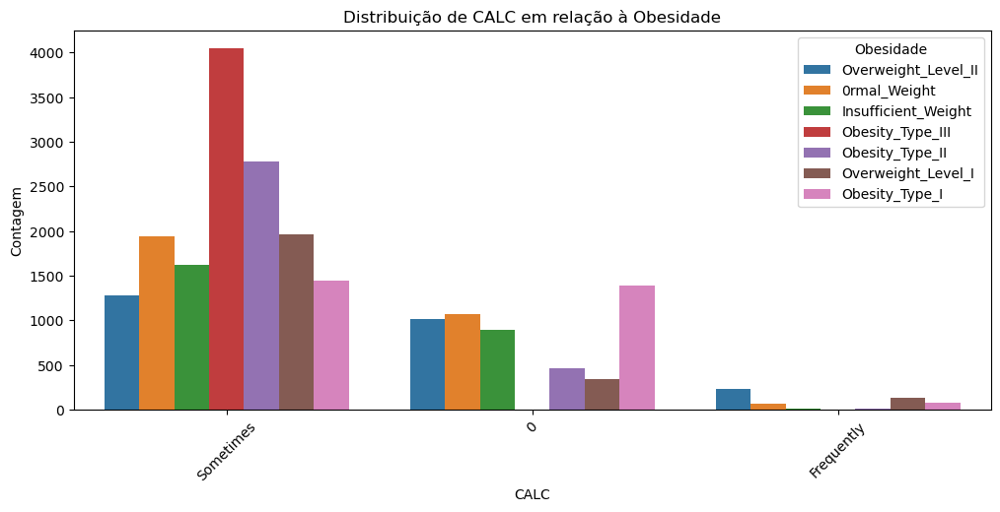

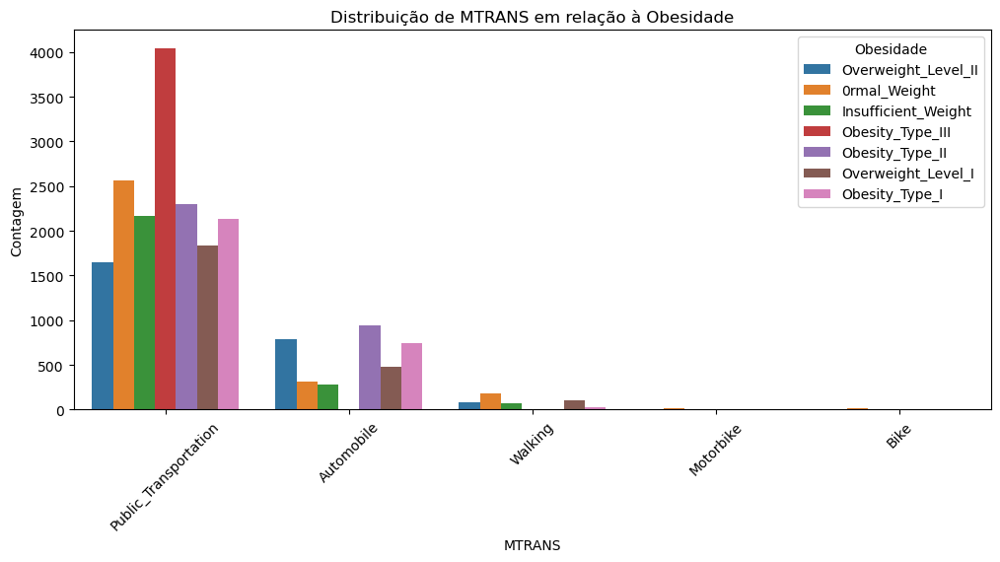

In [48]:
for col in categoricals:
    # Criar um gráfico de barras usando Seaborn
    plt.figure(figsize=(12, 5))
    sns.countplot(x=col, hue='0be1dad', data=data)
    plt.title(f'Distribuição de {col} em relação à Obesidade')
    plt.xlabel(col)
    plt.ylabel('Contagem')
    plt.legend(title='Obesidade', loc='upper right')
    plt.xticks(rotation=45)  # Rotaciona os rótulos do eixo x para melhor legibilidade
    plt.show()

###*2.4 Conclusões*

In [52]:
#Insira aqui as conclusões que você conseguiu absorver a partir desse Dataset.
Conclusoes_2 = """O grau de obesidade está completamente associado ao peso, uma vez que quanto maior, maior o grau de obesidade. 
Neste cenário, peso acima de 137.8 é considerado Obesidade Tipo III, entre 137.8e 131.27 é considerado Obesidade Tipo II, entre 93.5 e 131.27 é considerado Obesidade Tipo I e abaixo disso as classificações variam.
\nA altura tem pouca influência no grau de Obesidade, demonstrando grande variabilidade de classificação entre os dados, porém nota-se que indivíduos com altura superior a 1.88 não apresentaram Obesidade do Tipo III, exceto por um outlier com 1,92m de altura.
\nO número de refeições por dia também não parece um bom preditor, visto que tanto pessoas que fazem poucas refeições principais ao dia, quanto aquelas que fazem muitas refeições foram classificadas em todos os tipos de grau de Obesidade.
\nContrariamente ao que seria esperado, pessoas com sobrepeso e obesidade apresentaram consumos elevados de vegetais e de água.
\nEm relação a atividade física, apenas indivíduos com obesidade Tipo II demonstraram baixa adesão e aqueles com obesidade Tipo III foram os que perderam menos tempo em atividades sedentárias.
\n\nA Obesidade Tipo III só se apresentou em mulheres, enquanto a Tipo II só se apresentou em homens e a obesidade a Tipo I foi levemente mais prevalente também em homens.
O sobrepeso foi mais prevalente em homens e o peso insuficiente em mulheres.
\nHistórico familiar de sobrepeso demonstrou forte relação com a obesidade Tipo III, seguida pela Obesidade Tipo II e a Obesidade Tipo I em menor grau.
\nTodos os tipos de obesidade e sobrepeso foram associados a consumir comidas entre refeições as vezes, mas não a frequentemente ou sempre como poderia-se imaginar.
\nFumar não mostrou relações com a obesidade ou o sobrepeso.
\nNão monitorar o consumo calórico associou-se a todos os tipos de obesidade e sobrepeso, principalmente a Obesidade Tipo III.
\nO consumo de alcool as vezes apresentou associação com a obesidade Tipo III e Tipo II, além de apresentar relação com o sobrepeso nível I e II. Porém a obesidade Tipo I, apresentou tanto relação com o consumo esporádico quanto com a ausência de consumo alcolico.
\nO uso de transporte publico apresentou relação com todos os tipos de obesidade e graus de sobrepeso."""

print(Conclusoes_2)

O grau de obesidade está completamente associado ao peso, uma vez que quanto maior, maior o grau de obesidade. 
Neste cenário, peso acima de 137.8 é considerado Obesidade Tipo III, entre 137.8e 131.27 é considerado Obesidade Tipo II, entre 93.5 e 131.27 é considerado Obesidade Tipo I e abaixo disso as classificações variam.

A altura tem pouca influência no grau de Obesidade, demonstrando grande variabilidade de classificação entre os dados, porém nota-se que indivíduos com altura superior a 1.88 não apresentaram Obesidade do Tipo III, exceto por um outlier com 1,92m de altura.

O número de refeições por dia também não parece um bom preditor, visto que tanto pessoas que fazem poucas refeições principais ao dia, quanto aquelas que fazem muitas refeições foram classificadas em todos os tipos de grau de Obesidade.

Contrariamente ao que seria esperado, pessoas com sobrepeso e obesidade apresentaram consumos elevados de vegetais e de água.

Em relação a atividade física, apenas indivíduos 

##**Questão 3:** *Saúde Mental*


Examine as variações e tendências em questões de saúde mental em diferentes países e regiões, utilizando os dados apresentados no arquivo "q3_saude_mental.csv". Foque na análise da incidência de condições de saúde mental, uso de serviços de saúde mental, e atitudes gerais em relação a esses problemas ao longo do tempo. Procure estabelecer correlações entre os padrões de saúde mental e fatores socioeconômicos, políticas de saúde pública e características culturais dos países envolvidos. Esta investigação aprofundada permitirá uma compreensão mais rica das dinâmicas globais da saúde mental, destacando tendências significativas e identificando áreas específicas de preocupação em diferentes contextos regionais. Explore essas dimensões para elaborar estratégias efetivas de conscientização e intervenção em saúde mental globalmente.







###*3.1 Imports*

In [85]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

###*3.2 Dataset*

In [86]:

#Armazene o Dataset em uma variável para que você consiga utilizá-lo.
dfe = pd.read_csv('data/q3_saude_mental.csv')

### *3.3 Vizualização*

In [68]:

descricao_dados_3 = dfe.describe()

print(descricao_dados_3)

              Timestamp  Gender        Country Occupation self_employed  \
count            292364  292364         292364     292364        287162   
unique              580       2             35          5             2   
top     8/27/2014 11:43    Male  United States  Housewife            No   
freq               2384  239850         171308      66351        257994   

       family_history treatment Days_Indoors Growing_Stress Changes_Habits  \
count          292364    292364       292364         292364         292364   
unique              2         2            5              3              3   
top                No       Yes    1-14 days          Maybe            Yes   
freq           176832    147606        63548          99985         109523   

       Mental_Health_History Mood_Swings Coping_Struggles Work_Interest  \
count                 292364      292364           292364        292364   
unique                     3           3                2             3   
top     

In [69]:
not_a_number_3 = dfe.isnull().sum()

# Configurar pandas para exibir todas as linhas
pd.set_option('display.max_rows', None)

print(not_a_number_3)

Timestamp                     0
Gender                        0
Country                       0
Occupation                    0
self_employed              5202
family_history                0
treatment                     0
Days_Indoors                  0
Growing_Stress                0
Changes_Habits                0
Mental_Health_History         0
Mood_Swings                   0
Coping_Struggles              0
Work_Interest                 0
Social_Weakness               0
mental_health_interview       0
care_options                  0
dtype: int64


In [70]:
dfe = dfe.drop('self_employed', axis=1)

In [71]:
dfe.shape

(292364, 16)

In [72]:
not_a_number_3 = dfe.isnull().sum()

# Configurar pandas para exibir todas as linhas
pd.set_option('display.max_rows', None)

print(not_a_number_3)

Timestamp                  0
Gender                     0
Country                    0
Occupation                 0
family_history             0
treatment                  0
Days_Indoors               0
Growing_Stress             0
Changes_Habits             0
Mental_Health_History      0
Mood_Swings                0
Coping_Struggles           0
Work_Interest              0
Social_Weakness            0
mental_health_interview    0
care_options               0
dtype: int64


In [73]:
dfe.head(5)

,Timestamp,Gender,Country,Occupation,family_history,treatment,Days_Indoors,Growing_Stress,Changes_Habits,Mental_Health_History,Mood_Swings,Coping_Struggles,Work_Interest,Social_Weakness,mental_health_interview,care_options
0,8/27/2014 11:29,Female,United States,Corporate,No,Yes,1-14 days,Yes,No,Yes,Medium,No,No,Yes,No,Not sure
1,8/27/2014 11:31,Female,United States,Corporate,Yes,Yes,1-14 days,Yes,No,Yes,Medium,No,No,Yes,No,No
2,8/27/2014 11:32,Female,United States,Corporate,Yes,Yes,1-14 days,Yes,No,Yes,Medium,No,No,Yes,No,Yes
3,8/27/2014 11:37,Female,United States,Corporate,Yes,Yes,1-14 days,Yes,No,Yes,Medium,No,No,Yes,Maybe,Yes
4,8/27/2014 11:43,Female,United States,Corporate,Yes,Yes,1-14 days,Yes,No,Yes,Medium,No,No,Yes,No,Yes


In [74]:
# Verificar os tipos de dados de cada coluna
tipos_de_dados_3 = dfe.dtypes

# Filtrar colunas numéricas
colunas_numericas_3 = tipos_de_dados_3[tipos_de_dados_3 != 'object'].index.tolist()

# Filtrar colunas categóricas
colunas_categoricas_3 = tipos_de_dados_3[tipos_de_dados_3 == 'object'].index.tolist()

print("Colunas Numéricas:")
print(colunas_numericas_3)

print("\nColunas Categóricas:")
print(colunas_categoricas_3)

Colunas Numéricas:
[]

Colunas Categóricas:
['Timestamp', 'Gender', 'Country', 'Occupation', 'family_history', 'treatment', 'Days_Indoors', 'Growing_Stress', 'Changes_Habits', 'Mental_Health_History', 'Mood_Swings', 'Coping_Struggles', 'Work_Interest', 'Social_Weakness', 'mental_health_interview', 'care_options']


In [75]:
dfe = dfe.drop('Timestamp', axis=1)

In [76]:
# Verificar os tipos de dados de cada coluna
tipos_de_dados_3 = dfe.dtypes

# Filtrar colunas numéricas
colunas_numericas_3 = tipos_de_dados_3[tipos_de_dados_3 != 'object'].index.tolist()

# Filtrar colunas categóricas
colunas_categoricas_3 = tipos_de_dados_3[tipos_de_dados_3 == 'object'].index.tolist()

print("Colunas Numéricas:")
print(colunas_numericas_3)

print("\nColunas Categóricas:")
print(colunas_categoricas_3)

Colunas Numéricas:
[]

Colunas Categóricas:
['Gender', 'Country', 'Occupation', 'family_history', 'treatment', 'Days_Indoors', 'Growing_Stress', 'Changes_Habits', 'Mental_Health_History', 'Mood_Swings', 'Coping_Struggles', 'Work_Interest', 'Social_Weakness', 'mental_health_interview', 'care_options']


In [65]:
y = dfe['Mental_Health_History']

x = colunas_categoricas_3

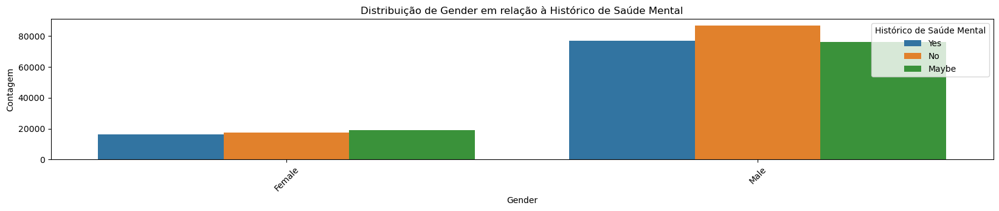

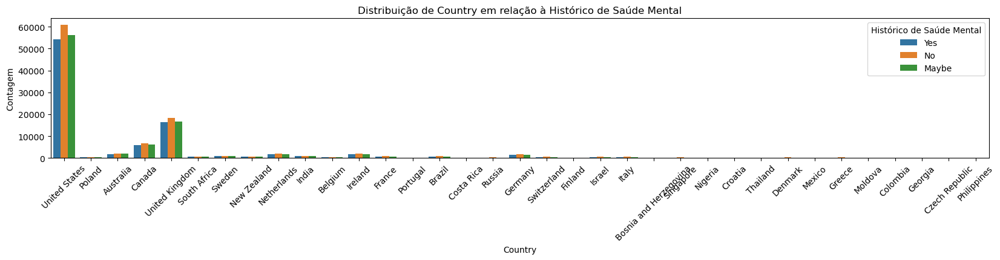

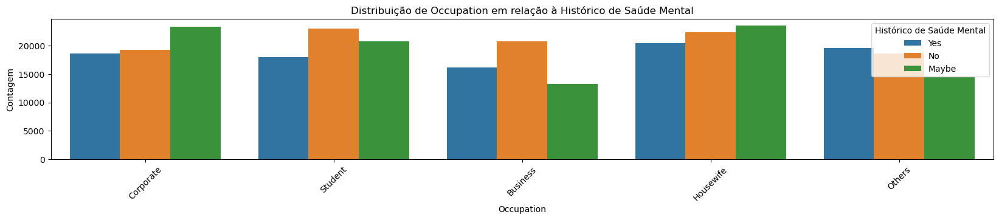

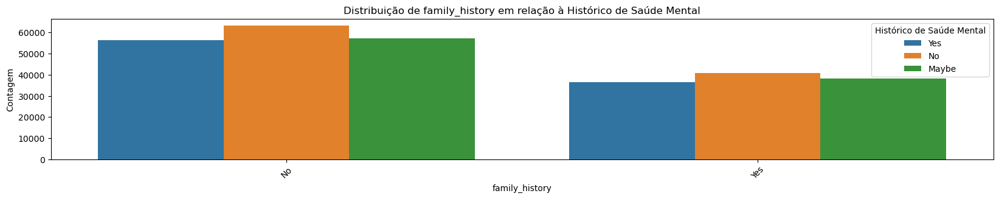

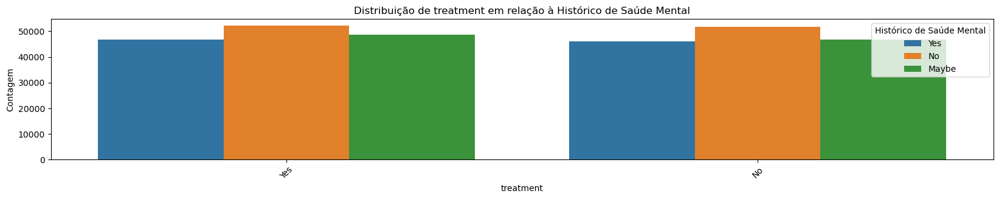

...

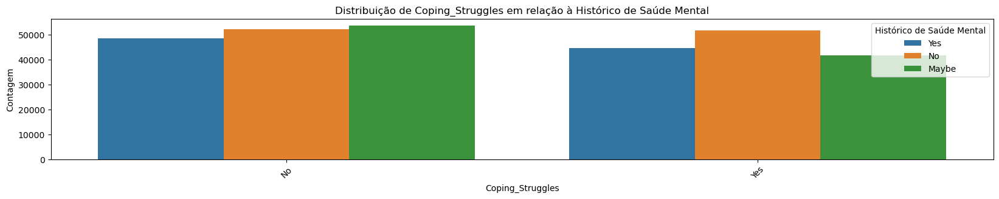

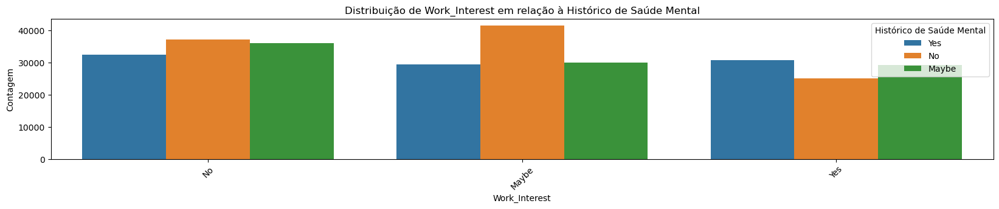

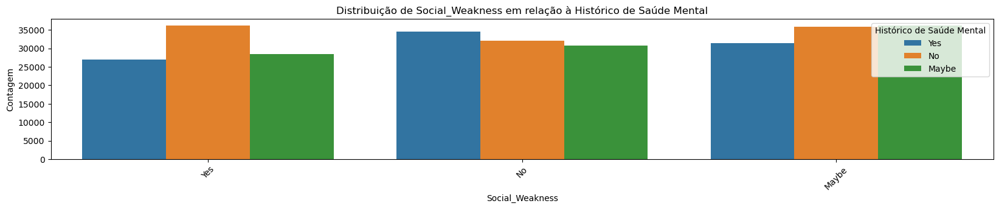

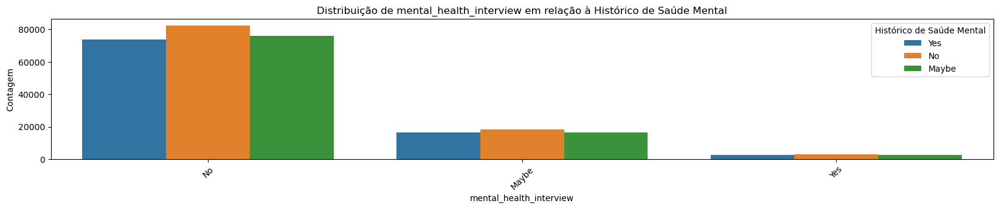

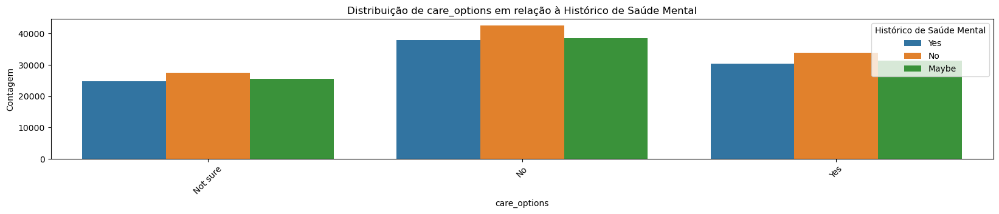

In [84]:
for col in dfe:
    # Criar um gráfico de barras usando Seaborn
    plt.figure(figsize=(20, 3))
    sns.countplot(x=col, hue='Mental_Health_History', data=dfe)
    plt.title(f'Distribuição de {col} em relação à Histórico de Saúde Mental')
    plt.xlabel(col)
    plt.ylabel('Contagem')
    plt.legend(title='Histórico de Saúde Mental', loc='upper right')
    plt.xticks(rotation=45)  # Rotaciona os rótulos do eixo x para melhor legibilidade
    plt.show()

###*3.4 Conclusões*

In [28]:
#Insira aqui as conclusões que você conseguiu absorver a partir desse Dataset.
Conclusoes = "Apesar de haverem diferenças entre os grupos, apenas as variaveis family_history e treatment apresentam baixa correlação (0.37)"






print(Conclusoes)

Apesar de haverem diferenças entre os grupos, apenas as variaveis family_history e treatment apresentam baixa correlação (0.37)


##**Questão 4:** *Top Músicas do Spotify*

Investigue as características das músicas mais populares no Spotify, conforme listadas no arquivo 'q4_spotify.csv'. Analise se há correlações entre características como dançabilidade, energia e valência com o sucesso da música, medido pelo número de streams e presença em playlists. Além disso, examine como essas características variam entre diferentes gêneros musicais e ao longo dos anos.

### *Código*

In [358]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

In [359]:

#Armazene o Dataset em uma variável para que você consiga utilizá-lo.
datasptf = pd.read_csv('data/q3_spotify.csv', encoding='iso-8859-1')


In [360]:
datasptf.head(5)

,track_name,artist(s)_name,artist_count,released_year,released_month,released_day,in_spotify_playlists,in_spotify_charts,streams,in_apple_playlists,in_apple_charts,in_deezer_playlists,in_deezer_charts,in_shazam_charts,bpm,key,mode,danceability_%,valence_%,energy_%,acousticness_%,instrumentalness_%,liveness_%,speechiness_%
0,Seven (feat. Latto) (Explicit Ver.),"Latto, Jung Kook",2,2023,7,14,553,147,141381703,43,263,45,10,826,125,B,Major,80,89,83,31,0,8,4
1,LALA,Myke Towers,1,2023,3,23,1474,48,133716286,48,126,58,14,382,92,C#,Major,71,61,74,7,0,10,4
2,vampire,Olivia Rodrigo,1,2023,6,30,1397,113,140003974,94,207,91,14,949,138,F,Major,51,32,53,17,0,31,6
3,Cruel Summer,Taylor Swift,1,2019,8,23,7858,100,800840817,116,207,125,12,548,170,A,Major,55,58,72,11,0,11,15
4,WHERE SHE GOES,Bad Bunny,1,2023,5,18,3133,50,303236322,84,133,87,15,425,144,A,Minor,65,23,80,14,63,11,6


In [361]:

descricao_dados_4 = datasptf.describe()

print(descricao_dados_4)

       artist_count  released_year  released_month  released_day  \
count    953.000000     953.000000      953.000000    953.000000   
mean       1.556139    2018.238195        6.033578     13.930745   
std        0.893044      11.116218        3.566435      9.201949   
min        1.000000    1930.000000        1.000000      1.000000   
25%        1.000000    2020.000000        3.000000      6.000000   
50%        1.000000    2022.000000        6.000000     13.000000   
75%        2.000000    2022.000000        9.000000     22.000000   
max        8.000000    2023.000000       12.000000     31.000000   

       in_spotify_playlists  in_spotify_charts  in_apple_playlists  \
count            953.000000         953.000000          953.000000   
mean            5200.124869          12.009444           67.812172   
std             7897.608990          19.575992           86.441493   
min               31.000000           0.000000            0.000000   
25%              875.000000          

In [362]:

not_a_number_4 = datasptf.isnull().sum()

# Configurar pandas para exibir todas as linhas
pd.set_option('display.max_rows', None)

print(not_a_number_4)


track_name               0
artist(s)_name           0
artist_count             0
released_year            0
released_month           0
released_day             0
in_spotify_playlists     0
in_spotify_charts        0
streams                  0
in_apple_playlists       0
in_apple_charts          0
in_deezer_playlists      0
in_deezer_charts         0
in_shazam_charts        50
bpm                      0
key                     95
mode                     0
danceability_%           0
valence_%                0
energy_%                 0
acousticness_%           0
instrumentalness_%       0
liveness_%               0
speechiness_%            0
dtype: int64


In [363]:
datasptf.shape

(953, 24)

In [364]:
datasptf = datasptf.dropna()

In [365]:
datasptf.shape

(817, 24)

In [366]:
pd.set_option('display.max_columns', None)
datasptf.head(10)

,track_name,artist(s)_name,artist_count,released_year,released_month,released_day,in_spotify_playlists,in_spotify_charts,streams,in_apple_playlists,in_apple_charts,in_deezer_playlists,in_deezer_charts,in_shazam_charts,bpm,key,mode,danceability_%,valence_%,energy_%,acousticness_%,instrumentalness_%,liveness_%,speechiness_%
0,Seven (feat. Latto) (Explicit Ver.),"Latto, Jung Kook",2,2023,7,14,553,147,141381703,43,263,45,10,826,125,B,Major,80,89,83,31,0,8,4
1,LALA,Myke Towers,1,2023,3,23,1474,48,133716286,48,126,58,14,382,92,C#,Major,71,61,74,7,0,10,4
2,vampire,Olivia Rodrigo,1,2023,6,30,1397,113,140003974,94,207,91,14,949,138,F,Major,51,32,53,17,0,31,6
3,Cruel Summer,Taylor Swift,1,2019,8,23,7858,100,800840817,116,207,125,12,548,170,A,Major,55,58,72,11,0,11,15
4,WHERE SHE GOES,Bad Bunny,1,2023,5,18,3133,50,303236322,84,133,87,15,425,144,A,Minor,65,23,80,14,63,11,6
5,Sprinter,"Dave, Central Cee",2,2023,6,1,2186,91,183706234,67,213,88,17,946,141,C#,Major,92,66,58,19,0,8,24
6,Ella Baila Sola,"Eslabon Armado, Peso Pluma",2,2023,3,16,3090,50,725980112,34,222,43,13,418,148,F,Minor,67,83,76,48,0,8,3
7,Columbia,Quevedo,1,2023,7,7,714,43,58149378,25,89,30,13,194,100,F,Major,67,26,71,37,0,11,4
8,fukumean,Gunna,1,2023,5,15,1096,83,95217315,60,210,48,11,953,130,C#,Minor,85,22,62,12,0,28,9
9,La Bebe - Remix,"Peso Pluma, Yng Lvcas",2,2023,3,17,2953,44,553634067,49,110,66,13,339,170,D,Minor,81,56,48,21,0,8,33


In [367]:
datasptf = datasptf.drop('track_name', axis=1)

In [368]:
datasptf = datasptf.drop('artist(s)_name', axis=1)

datasptf.head(5)

,artist_count,released_year,released_month,released_day,in_spotify_playlists,in_spotify_charts,streams,in_apple_playlists,in_apple_charts,in_deezer_playlists,in_deezer_charts,in_shazam_charts,bpm,key,mode,danceability_%,valence_%,energy_%,acousticness_%,instrumentalness_%,liveness_%,speechiness_%
0,2,2023,7,14,553,147,141381703,43,263,45,10,826,125,B,Major,80,89,83,31,0,8,4
1,1,2023,3,23,1474,48,133716286,48,126,58,14,382,92,C#,Major,71,61,74,7,0,10,4
2,1,2023,6,30,1397,113,140003974,94,207,91,14,949,138,F,Major,51,32,53,17,0,31,6
3,1,2019,8,23,7858,100,800840817,116,207,125,12,548,170,A,Major,55,58,72,11,0,11,15
4,1,2023,5,18,3133,50,303236322,84,133,87,15,425,144,A,Minor,65,23,80,14,63,11,6


In [369]:

# Selecionar colunas com tipo 'object'
colunas_string_ = datasptf.select_dtypes(include=['object']).columns

# Imprimir as colunas encontradas
print("Colunas com strings:")
print(colunas_string)


Colunas com strings:
Index(['streams', 'in_deezer_playlists', 'in_shazam_charts', 'key', 'mode'], dtype='object')


In [328]:
datasptf.shape

(817, 33)

###*Conclusões*

In [ ]:
#Insira aqui as conclusões que você conseguiu absorver a partir desse Dataset.
Conclusoes = ""






print(Conclusoes)